<a href="https://colab.research.google.com/github/kirmel4/ImageColorizerAE/blob/main/ImageColorizerAutoEncoderPyTorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Image Colorizer based on AutoEncoder (pytorch)

In [2]:
from matplotlib.pyplot import imshow
import numpy as np
import cv2
from skimage.color import rgb2lab, lab2rgb
from skimage.transform import resize
import imageio
import random
from skimage.io import imsave
import os
import matplotlib as plt
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import torch
from torch.autograd import Variable
import numpy as np
import torch.nn.functional as F
import torchvision
from torchvision import transforms
import torch.optim as optim
from torchsummary import summary
from torch import nn
import matplotlib.pyplot as plt
from torch import distributions
import torchvision.transforms as T
from PIL import Image
from pathlib import Path
from skimage import io
from torch.utils.data import random_split
!pip install git+https://github.com/tensorflow/docs
import tensorflow_docs.vis.embed as embed
!pip install bing-image-downloader
from bing_image_downloader import downloader
!pip install split-folders
import splitfolders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Dataset collection

In [3]:
downloader.download('landscapes', limit=100,  output_dir='dataset', 
adult_filter_off=True, force_replace=False, timeout=60)

[%] Downloading Images to /content/dataset/landscapes


[!!]Indexing page: 1

[%] Indexed 35 Images on Page 1.


[%] Downloading Image #1 from https://static.photocdn.pt/images/articles/2018/05/01/articles/2017_8/iStock-483771218-min.jpg
[%] File Downloaded !

[%] Downloading Image #2 from http://3.bp.blogspot.com/-yvHXo7HtHDE/UATxfDGF1BI/AAAAAAAAFFM/hFE4J9QtiYQ/s1600/Landscape.jpg
[%] File Downloaded !

[%] Downloading Image #3 from http://wallpapercave.com/wp/jgbFbWR.jpg
[%] File Downloaded !

[%] Downloading Image #4 from http://www.pixelstalk.net/wp-content/uploads/2016/04/Download-landscape-wallpaper-hd.jpg
[%] File Downloaded !

[%] Downloading Image #5 from https://www.99inspiration.com/wp-content/uploads/2016/01/Beautiful-Landscape-Photography-by-Daniel-Herr.jpg
[%] File Downloaded !

[%] Downloading Image #6 from https://3.bp.blogspot.com/-KQg4ly8S4Gc/V2uEEyqbtOI/AAAAAAAACO0/GBe83Xo8wEo-PzFYjb2KqVA4MsRXJ6rrACKgB/s1600/wonderful%2Blandscape%2Bwallpaper%2B2.jpg
[%] File Download

In [4]:
SIZE = 256
path = '/content/dataset'

Splitting training data into train and val data

In [5]:
splitfolders.ratio(path,
                   output=path, 
                   seed=42, 
                   ratio=(.9, 0, .1), 
                   group_prefix=None, 
                   move=False
                   )

Copying files: 100 files [00:00, 1503.67 files/s]


In [6]:
train_path = '/content/dataset/train/landscapes'
test_path = '/content/dataset/test/landscapes'

#Аугментация
Будем обеспечивать только афинные преобразования (без сдвига и изменения цветовой гаммы картинки), так как мы хотим научить модель сопоставлять паттерн рисунка и цвет, который он может иметь

In [7]:
augmentation = T.RandomApply(transforms=[T.RandomRotation(degrees=(0, 25)), T.RandomHorizontalFlip(p=0.5)], p=0.5)

Создадим кастомный датасет и от него наследуем тестовый для переопределение некоторых функций (так как нам не нужна аугментация на валидации)

Вместо RGB мы будем работать с LAB изображениями.

Каналы:

*   L: яркость (от 0 до 100). Что по факту является чб изображением. Оно не выглядит как RGB изображение преобразовать в ЧБ, но достаточно близко

*   a: красно-зеленый канал (от -128 до 127 )
*   b: голубо-желтый канал (-128 до 127)



В таком формате мы имеем L канал как входной в модель, а предсказываемых каналов теперь стало 2, а не 3 как в RGB формате

In [8]:
class dataset(Dataset):
    def __init__(self, path, augmentation):
      self.path = path
      self.augmentation = augmentation
      self.x_data = None
      self.y_data = None
    def __getitem__(self, index):
      self.x_data, self.y_data = self.preprocessing(self.path, index, augmentation) 
      return self.x_data , self.y_data

    def __len__(self):
      return len(os.listdir(self.path))
    
    def preprocessing(self, path, index, augmentation):
      img_data = []
      img = Image.open(self.path +'/' + os.listdir(self.path)[index])
      augmented_img = self.augmentation(img)
      img=cv2.resize(np.array(augmented_img),(SIZE, SIZE))
      img_data.append(img)
      img_array = np.reshape(img_data, (len(img_data), SIZE, SIZE, 3))
      img_array = img_array.astype('float32') / 255.

      X =[]
      Y =[]

      lab = rgb2lab(img_array[0])
      X.append(lab[:,:,0]) 
      Y.append(lab[:,:,1:] / 128)
      #Значения a и b от -127 до 128, 
      #делим их на 128 чтобы получить значения от -1 до 1.
      X = np.array(X)
      Y = np.array(Y)
      X = X.reshape(X.shape+(1,))
      X = np.swapaxes(X.squeeze(0), 0 ,2)
      Y = np.swapaxes(Y.squeeze(0), 0 ,2)
      return X, Y

In [9]:
class t_dataset(dataset):
  def __init__(self, path):
      self.path = path
      self.x_data = None
      self.y_data = None
  def __getitem__(self, index):
      self.x_data, self.y_data = self.preprocessing(self.path, index) 
      return self.x_data , self.y_data
  def preprocessing(self, path, index):
      img_data = []
      img = Image.open(self.path +'/' + os.listdir(self.path)[index])
      img=cv2.resize(np.array(img),(SIZE, SIZE))
      img_data.append(img)
      img_array = np.reshape(img_data, (len(img_data), SIZE, SIZE, 3))
      img_array = img_array.astype('float32') / 255.

      X =[]
      Y =[]

      lab = rgb2lab(img_array[0])
      X.append(lab[:,:,0]) 
      Y.append(lab[:,:,1:] / 128)
      X = np.array(X)
      Y = np.array(Y)
      X = X.reshape(X.shape+(1,))
      X = np.swapaxes(X.squeeze(0), 0 ,2)
      Y = np.swapaxes(Y.squeeze(0), 0 ,2)
      return X, Y

In [10]:
train_dataset = dataset(train_path, augmentation)
test_dataset = t_dataset(test_path)

In [11]:
print(len(test_dataset))
print(len(train_dataset))

10
90


Создание даталоадеров

In [12]:
l = len(test_dataset)
batch_size=8

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size = batch_size)
val_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)

#АвтоЭнкодер
Энкодер представляет собой свёрточную нейронную сеть со слоями 16, 16, 64, 64, 128, 128 фильтров, декодер соответственно имеет перевёрнутую архитектуру. Скрытый слой имеет размерность 8192. На последнем слое функция активации tanh, так как значения a и b могут принимать отрицательные и положительные значения. Такая архитектура показала наилучшие результаты в процессе обучения. 

In [137]:
class Encoder(nn.Module):

    def __init__(self):
        super().__init__()
        
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(1, 16, 3, stride = 2, padding = 1),
            nn.ReLU(True),
            nn.Conv2d(16, 16, 3, stride = 2, padding = 1),
            nn.ReLU(True),
            nn.Conv2d(16, 64, 3, stride = 2, padding = 1),
            nn.ReLU(True),
            nn.Conv2d(64, 64, 3,stride = 2, padding = 1),
            nn.ReLU(True),
            nn.Conv2d(64, 128, 3, stride = 2, padding = 1),
            nn.ReLU(True),
            nn.Conv2d(128, 128, 3, padding = 1),
            nn.ReLU(True),
        )
        self.flatten = nn.Flatten()
    def forward(self, x):
      
        x = x.to(device)
        x = self.encoder_cnn(x)
      
        return x

class Decoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 3, stride= 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 64, 3,stride= 2, padding = 1),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 16, 3, stride =2, padding =1 ),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 16, 3, stride =2, padding = 1) ,
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 2, 3, stride =2, padding = 2, output_padding = 1 ))
    def forward(self, x):

        x = self.decoder_conv(x)
        x = torch.tanh(x)

        return x

Определение функции ошибки и алгоритма оптимизации

In [138]:
loss_fn = torch.nn.MSELoss()

lr= 0.001

torch.manual_seed(0)

encoder = Encoder()
decoder = Decoder()
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]

optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

encoder.to(device)
decoder.to(device)
summary(encoder, (1, 256, 256))
summary(decoder, (128, 8, 8))

Selected device: cuda
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]             160
              ReLU-2         [-1, 16, 128, 128]               0
            Conv2d-3           [-1, 16, 64, 64]           2,320
              ReLU-4           [-1, 16, 64, 64]               0
            Conv2d-5           [-1, 64, 32, 32]           9,280
              ReLU-6           [-1, 64, 32, 32]               0
            Conv2d-7           [-1, 64, 16, 16]          36,928
              ReLU-8           [-1, 64, 16, 16]               0
            Conv2d-9            [-1, 128, 8, 8]          73,856
             ReLU-10            [-1, 128, 8, 8]               0
           Conv2d-11            [-1, 128, 8, 8]         147,584
             ReLU-12            [-1, 128, 8, 8]               0
Total params: 270,128
Trainable params: 270,128
Non-trainable params: 0
---------

Функции для тренировки и валидации

In [140]:
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer):
    encoder.train()
    decoder.train()
    train_loss = []

    for image_batch, y in dataloader: 
      
        image_batch, y = image_batch.cuda(), y.cuda()
        image_batch = image_batch.to(device)
        encoded_data = encoder(image_batch)
        decoded_data = decoder(encoded_data)
        loss = loss_fn(decoded_data, y)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [141]:
def test_epoch(encoder, decoder, device, dataloader, loss_fn):
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        conc_out = []
        conc_label = []
        for image_batch, y in dataloader:
            image_batch = image_batch.to(device)
            encoded_data = encoder(image_batch)
            decoded_data = decoder(encoded_data)
            conc_out.append(decoded_data.cpu())
            conc_label.append(y.cpu())
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

Фукнция для демонстрации обучения в формате gif

In [142]:
img_epoch_arr = []
def plot_training(encoder,decoder):
  img_color=[]
  img=cv2.imread('/content/dataset/test/landscapes/Image_21.jpg')  #выберите любую картинку чтобы отследить обучение на ней
  img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
  img=cv2.resize(img,(SIZE, SIZE))
  img_color.append(img)
  img_color = np.array(img_color, dtype=float)
  img_color = rgb2lab(1.0/255*img_color)[:,:,:,0]
  img_color = img_color.reshape(img_color.shape+(1,))
  output = decoder(encoder(torch.Tensor(np.swapaxes(img_color, 1,3)))).cpu().detach().numpy()
  output = np.swapaxes(output, 1, 3)
  output = output*128
  result = np.zeros((256, 256, 3))
  result[:,:,0] = img_color[0][:,:,0]
  result[:,:,1:] = output[0]
  result = np.swapaxes(result, 0, 1)
  result = lab2rgb(np.swapaxes(result, 0,1))
  img_epoch_arr.append(result)



#Обучение

In [143]:
num_epochs = 250
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
   train_loss =train_epoch(encoder,decoder,device,
   train_loader,loss_fn,optim)
   val_loss = test_epoch(encoder,decoder,device,val_loader,loss_fn)
   print('\n EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss, val_loss))
   diz_loss['train_loss'].append(train_loss)
   diz_loss['val_loss'].append(val_loss)
   if epoch % 5 == 0:
      plot_training(encoder,decoder)


 EPOCH 1/250 	 train loss 0.0346493199467659 	 val loss 0.025174280628561974

 EPOCH 2/250 	 train loss 0.031126217916607857 	 val loss 0.023584485054016113

 EPOCH 3/250 	 train loss 0.0293290838599205 	 val loss 0.022195622324943542

 EPOCH 4/250 	 train loss 0.027828387916088104 	 val loss 0.021341724321246147

 EPOCH 5/250 	 train loss 0.02740509994328022 	 val loss 0.02099495567381382

 EPOCH 6/250 	 train loss 0.026981046423316002 	 val loss 0.020953090861439705

 EPOCH 7/250 	 train loss 0.026769086718559265 	 val loss 0.02054157853126526

 EPOCH 8/250 	 train loss 0.026448562741279602 	 val loss 0.020207753404974937

 EPOCH 9/250 	 train loss 0.026152392849326134 	 val loss 0.020187310874462128

 EPOCH 10/250 	 train loss 0.026481011882424355 	 val loss 0.019995490089058876

 EPOCH 11/250 	 train loss 0.026073938235640526 	 val loss 0.019807297736406326

 EPOCH 12/250 	 train loss 0.025871919468045235 	 val loss 0.01961737871170044

 EPOCH 13/250 	 train loss 0.025591174140572

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return func(*args, **kwargs)



 EPOCH 72/250 	 train loss 0.019157005473971367 	 val loss 0.018952611833810806

 EPOCH 73/250 	 train loss 0.018844880163669586 	 val loss 0.019740203395485878

 EPOCH 74/250 	 train loss 0.018007559701800346 	 val loss 0.020107636228203773

 EPOCH 75/250 	 train loss 0.0185927152633667 	 val loss 0.019319141283631325

 EPOCH 76/250 	 train loss 0.018046658486127853 	 val loss 0.02077825367450714


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 20 pixels
  return func(*args, **kwargs)



 EPOCH 77/250 	 train loss 0.01926487125456333 	 val loss 0.021322017535567284

 EPOCH 78/250 	 train loss 0.01969265379011631 	 val loss 0.019626092165708542

 EPOCH 79/250 	 train loss 0.018705392256379128 	 val loss 0.023545119911432266

 EPOCH 80/250 	 train loss 0.018254097551107407 	 val loss 0.021704599261283875

 EPOCH 81/250 	 train loss 0.018393566831946373 	 val loss 0.02133781835436821


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 5 pixels
  return func(*args, **kwargs)



 EPOCH 82/250 	 train loss 0.018421867862343788 	 val loss 0.020377082750201225

 EPOCH 83/250 	 train loss 0.01817191205918789 	 val loss 0.021357852965593338

 EPOCH 84/250 	 train loss 0.01825794018805027 	 val loss 0.020799096673727036

 EPOCH 85/250 	 train loss 0.017707107588648796 	 val loss 0.02182628959417343

 EPOCH 86/250 	 train loss 0.01790480501949787 	 val loss 0.02061314880847931


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 6 pixels
  return func(*args, **kwargs)



 EPOCH 87/250 	 train loss 0.01739819534122944 	 val loss 0.02030390128493309

 EPOCH 88/250 	 train loss 0.017590248957276344 	 val loss 0.02133851684629917

 EPOCH 89/250 	 train loss 0.016771182417869568 	 val loss 0.0228427741676569

 EPOCH 90/250 	 train loss 0.01753607578575611 	 val loss 0.020233627408742905

 EPOCH 91/250 	 train loss 0.017033487558364868 	 val loss 0.021455533802509308


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 15 pixels
  return func(*args, **kwargs)



 EPOCH 92/250 	 train loss 0.016536226496100426 	 val loss 0.020213376730680466

 EPOCH 93/250 	 train loss 0.01581316441297531 	 val loss 0.02096768468618393

 EPOCH 94/250 	 train loss 0.016039857640862465 	 val loss 0.022154653444886208

 EPOCH 95/250 	 train loss 0.016294481232762337 	 val loss 0.02002422884106636

 EPOCH 96/250 	 train loss 0.016833744943141937 	 val loss 0.020129038020968437


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 12 pixels
  return func(*args, **kwargs)



 EPOCH 97/250 	 train loss 0.016537239775061607 	 val loss 0.02408515475690365

 EPOCH 98/250 	 train loss 0.017293883487582207 	 val loss 0.02167772687971592

 EPOCH 99/250 	 train loss 0.01881001889705658 	 val loss 0.01885412260890007

 EPOCH 100/250 	 train loss 0.016133323311805725 	 val loss 0.020984182134270668

 EPOCH 101/250 	 train loss 0.016888516023755074 	 val loss 0.020079828798770905


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 21 pixels
  return func(*args, **kwargs)



 EPOCH 102/250 	 train loss 0.01629817858338356 	 val loss 0.021893100813031197

 EPOCH 103/250 	 train loss 0.016354188323020935 	 val loss 0.021717237308621407

 EPOCH 104/250 	 train loss 0.017941979691386223 	 val loss 0.01997462660074234

 EPOCH 105/250 	 train loss 0.016734963282942772 	 val loss 0.02511935494840145

 EPOCH 106/250 	 train loss 0.01800963468849659 	 val loss 0.021847939118742943


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 32 pixels
  return func(*args, **kwargs)



 EPOCH 107/250 	 train loss 0.016446935012936592 	 val loss 0.021147925406694412

 EPOCH 108/250 	 train loss 0.01669861562550068 	 val loss 0.022963611409068108

 EPOCH 109/250 	 train loss 0.016536904498934746 	 val loss 0.021643836051225662

 EPOCH 110/250 	 train loss 0.015722403302788734 	 val loss 0.020832179114222527

 EPOCH 111/250 	 train loss 0.014600984752178192 	 val loss 0.02110750786960125


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 26 pixels
  return func(*args, **kwargs)



 EPOCH 112/250 	 train loss 0.015141145326197147 	 val loss 0.021997101604938507

 EPOCH 113/250 	 train loss 0.01546561997383833 	 val loss 0.023012816905975342

 EPOCH 114/250 	 train loss 0.014889371581375599 	 val loss 0.024192944169044495

 EPOCH 115/250 	 train loss 0.015514299273490906 	 val loss 0.02200832962989807

 EPOCH 116/250 	 train loss 0.01470857486128807 	 val loss 0.02122294157743454


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 36 pixels
  return func(*args, **kwargs)



 EPOCH 117/250 	 train loss 0.015658436343073845 	 val loss 0.021879371255636215

 EPOCH 118/250 	 train loss 0.01568439230322838 	 val loss 0.025620494037866592

 EPOCH 119/250 	 train loss 0.01544541772454977 	 val loss 0.022486578673124313

 EPOCH 120/250 	 train loss 0.014823500998318195 	 val loss 0.021324152126908302

 EPOCH 121/250 	 train loss 0.01533134188503027 	 val loss 0.020400986075401306


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 29 pixels
  return func(*args, **kwargs)



 EPOCH 122/250 	 train loss 0.015531051903963089 	 val loss 0.020253492519259453

 EPOCH 123/250 	 train loss 0.014828846789896488 	 val loss 0.02110554836690426

 EPOCH 124/250 	 train loss 0.014673794619739056 	 val loss 0.02231639437377453

 EPOCH 125/250 	 train loss 0.014795616269111633 	 val loss 0.0207210723310709

 EPOCH 126/250 	 train loss 0.015087667852640152 	 val loss 0.020758401602506638

 EPOCH 127/250 	 train loss 0.014075960963964462 	 val loss 0.021702919155359268

 EPOCH 128/250 	 train loss 0.014826036989688873 	 val loss 0.02248622290790081

 EPOCH 129/250 	 train loss 0.014352142810821533 	 val loss 0.02184382453560829

 EPOCH 130/250 	 train loss 0.015121395699679852 	 val loss 0.021507032215595245

 EPOCH 131/250 	 train loss 0.014569122344255447 	 val loss 0.020276140421628952


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 8 pixels
  return func(*args, **kwargs)



 EPOCH 132/250 	 train loss 0.01426229253411293 	 val loss 0.020363282412290573

 EPOCH 133/250 	 train loss 0.014245234429836273 	 val loss 0.02257780358195305

 EPOCH 134/250 	 train loss 0.015309588052332401 	 val loss 0.020885448902845383

 EPOCH 135/250 	 train loss 0.014747980050742626 	 val loss 0.02058243937790394

 EPOCH 136/250 	 train loss 0.014532684348523617 	 val loss 0.023075226694345474


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 47 pixels
  return func(*args, **kwargs)



 EPOCH 137/250 	 train loss 0.013882816769182682 	 val loss 0.0220024436712265

 EPOCH 138/250 	 train loss 0.013868450187146664 	 val loss 0.02083030715584755

 EPOCH 139/250 	 train loss 0.01358803827315569 	 val loss 0.02037494257092476

 EPOCH 140/250 	 train loss 0.013416982255876064 	 val loss 0.021777205169200897

 EPOCH 141/250 	 train loss 0.014078867621719837 	 val loss 0.020539741963148117

 EPOCH 142/250 	 train loss 0.013454900123178959 	 val loss 0.021704435348510742

 EPOCH 143/250 	 train loss 0.014200233854353428 	 val loss 0.02266472391784191

 EPOCH 144/250 	 train loss 0.014079730026423931 	 val loss 0.021098578348755836

 EPOCH 145/250 	 train loss 0.013142761774361134 	 val loss 0.019860198721289635

 EPOCH 146/250 	 train loss 0.012795583344995975 	 val loss 0.021614035591483116

 EPOCH 147/250 	 train loss 0.013342875987291336 	 val loss 0.019568370655179024

 EPOCH 148/250 	 train loss 0.013233342207968235 	 val loss 0.02006324753165245

 EPOCH 149/250 	 train

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 19 pixels
  return func(*args, **kwargs)



 EPOCH 182/250 	 train loss 0.01338775921612978 	 val loss 0.021873153746128082

 EPOCH 183/250 	 train loss 0.01227628719061613 	 val loss 0.022124651819467545

 EPOCH 184/250 	 train loss 0.013394753448665142 	 val loss 0.021615784615278244

 EPOCH 185/250 	 train loss 0.013162960298359394 	 val loss 0.021026823669672012

 EPOCH 186/250 	 train loss 0.012531538493931293 	 val loss 0.02102695219218731


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 41 pixels
  return func(*args, **kwargs)



 EPOCH 187/250 	 train loss 0.013390782289206982 	 val loss 0.020254923030734062

 EPOCH 188/250 	 train loss 0.013270559720695019 	 val loss 0.021936509758234024

 EPOCH 189/250 	 train loss 0.01223723590373993 	 val loss 0.02159564010798931

 EPOCH 190/250 	 train loss 0.012142213992774487 	 val loss 0.022030269727110863

 EPOCH 191/250 	 train loss 0.012207192368805408 	 val loss 0.0217304490506649


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 17 pixels
  return func(*args, **kwargs)



 EPOCH 192/250 	 train loss 0.012045960873365402 	 val loss 0.021023480221629143

 EPOCH 193/250 	 train loss 0.011941521428525448 	 val loss 0.01839788630604744

 EPOCH 194/250 	 train loss 0.01227108109742403 	 val loss 0.019568970426917076

 EPOCH 195/250 	 train loss 0.011801776476204395 	 val loss 0.020263954997062683

 EPOCH 196/250 	 train loss 0.011848402209579945 	 val loss 0.02179032750427723


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 7 pixels
  return func(*args, **kwargs)



 EPOCH 197/250 	 train loss 0.012018063105642796 	 val loss 0.02121945284307003

 EPOCH 198/250 	 train loss 0.012153624556958675 	 val loss 0.018872719258069992

 EPOCH 199/250 	 train loss 0.011560539714992046 	 val loss 0.0195202324539423

 EPOCH 200/250 	 train loss 0.011169536970555782 	 val loss 0.019635725766420364

 EPOCH 201/250 	 train loss 0.011192631907761097 	 val loss 0.01876431703567505


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 4 pixels
  return func(*args, **kwargs)



 EPOCH 202/250 	 train loss 0.010901088826358318 	 val loss 0.019717145711183548

 EPOCH 203/250 	 train loss 0.011391818523406982 	 val loss 0.021835079416632652

 EPOCH 204/250 	 train loss 0.010542032308876514 	 val loss 0.018917029723525047

 EPOCH 205/250 	 train loss 0.011454444378614426 	 val loss 0.019692782312631607

 EPOCH 206/250 	 train loss 0.011366013437509537 	 val loss 0.01871662400662899

 EPOCH 207/250 	 train loss 0.011351053602993488 	 val loss 0.018497701734304428

 EPOCH 208/250 	 train loss 0.011066083796322346 	 val loss 0.019000133499503136

 EPOCH 209/250 	 train loss 0.011499595828354359 	 val loss 0.01952625997364521

 EPOCH 210/250 	 train loss 0.010903830640017986 	 val loss 0.01976252906024456

 EPOCH 211/250 	 train loss 0.010399053804576397 	 val loss 0.02019856497645378


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 10 pixels
  return func(*args, **kwargs)



 EPOCH 212/250 	 train loss 0.01025098841637373 	 val loss 0.019870582967996597

 EPOCH 213/250 	 train loss 0.010953671298921108 	 val loss 0.02044261060655117

 EPOCH 214/250 	 train loss 0.010543583892285824 	 val loss 0.01898866705596447

 EPOCH 215/250 	 train loss 0.011957850307226181 	 val loss 0.019886750727891922

 EPOCH 216/250 	 train loss 0.010994481854140759 	 val loss 0.019511807709932327

 EPOCH 217/250 	 train loss 0.012017864733934402 	 val loss 0.01824030838906765

 EPOCH 218/250 	 train loss 0.010796396993100643 	 val loss 0.018704043701291084

 EPOCH 219/250 	 train loss 0.01083954144269228 	 val loss 0.018323294818401337

 EPOCH 220/250 	 train loss 0.010781277902424335 	 val loss 0.01885734125971794

 EPOCH 221/250 	 train loss 0.010275870561599731 	 val loss 0.01915435865521431


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return func(*args, **kwargs)



 EPOCH 222/250 	 train loss 0.010709750466048717 	 val loss 0.01766478642821312

 EPOCH 223/250 	 train loss 0.01029095146805048 	 val loss 0.01778871938586235

 EPOCH 224/250 	 train loss 0.010352055542171001 	 val loss 0.020881492644548416

 EPOCH 225/250 	 train loss 0.009795604273676872 	 val loss 0.018661020323634148

 EPOCH 226/250 	 train loss 0.010056680999696255 	 val loss 0.019340423867106438

 EPOCH 227/250 	 train loss 0.010633286088705063 	 val loss 0.01990659162402153

 EPOCH 228/250 	 train loss 0.009803672321140766 	 val loss 0.019060680642724037

 EPOCH 229/250 	 train loss 0.009760375134646893 	 val loss 0.018647540360689163

 EPOCH 230/250 	 train loss 0.010042308829724789 	 val loss 0.01956620067358017

 EPOCH 231/250 	 train loss 0.009587882086634636 	 val loss 0.01940346136689186

 EPOCH 232/250 	 train loss 0.009631344117224216 	 val loss 0.019790446385741234

 EPOCH 233/250 	 train loss 0.009590222500264645 	 val loss 0.018274269998073578

 EPOCH 234/250 	 trai

В данной задаче мы использовали метрику MSE лосс. Как можно заметить он небольшой с самого начала обучения. На валидации за 250 эпох мы достигли **0.018**, хотя во время обучения опускалось до 0.017. Небольшие изменения лосса приводят к большим изменениям в предсказании цветов. Тем не менее, при демонстрации модель выдаёт неплохие результаты.

Сохранение и загрузка модели

In [144]:
torch.save(encoder.state_dict(), '/content/modelenc')
torch.save(decoder.state_dict(), '/content/modeldec')

In [ ]:

'''
encoder = Encoder()
encoder.load_state_dict(torch.load('/content/modelenc'))
encoder.eval()
decoder = Decoder()
decoder.load_state_dict(torch.load('/content/modeldec'))
decoder.eval()
'''

"\nencoder = Encoder()\nencoder.load_state_dict(torch.load('/content/modelenc'))\nencoder.eval()\ndecoder = Decoder()\ndecoder.load_state_dict(torch.load('/content/modeldec'))\ndecoder.eval()\n"

Анимация обучения

In [ ]:
anim_file = 'train.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  for img in img_epoch_arr:
      writer.append_data(img)


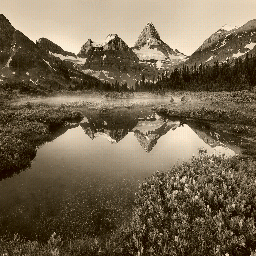

In [146]:
embed.embed_file(anim_file)

Демонстрация результатов

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 40 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 69 pixels
  return func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 39 pixels
  return func(*args, **kwargs)


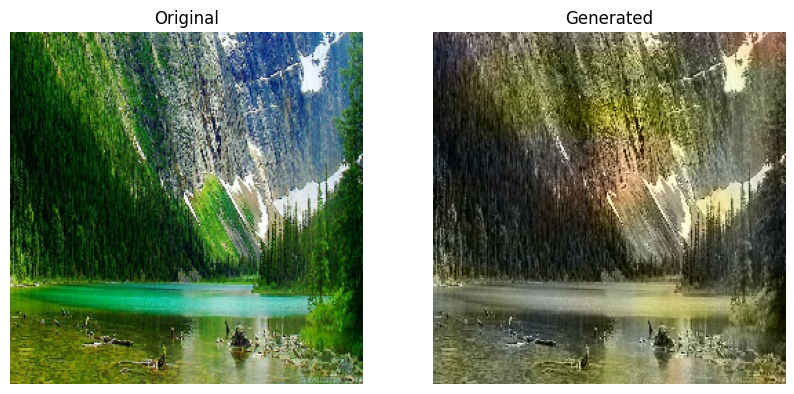

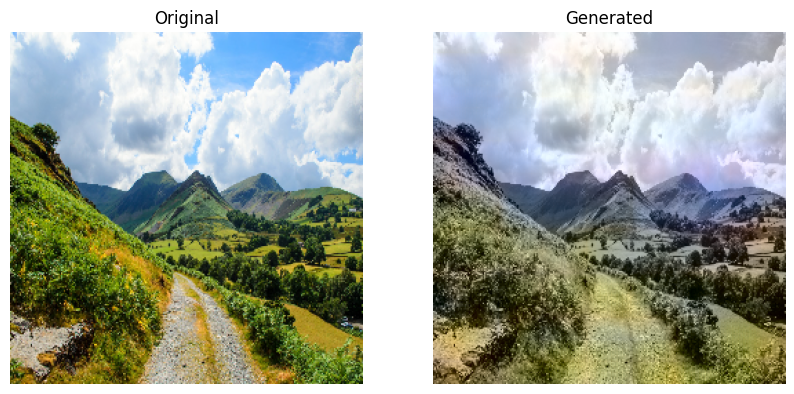

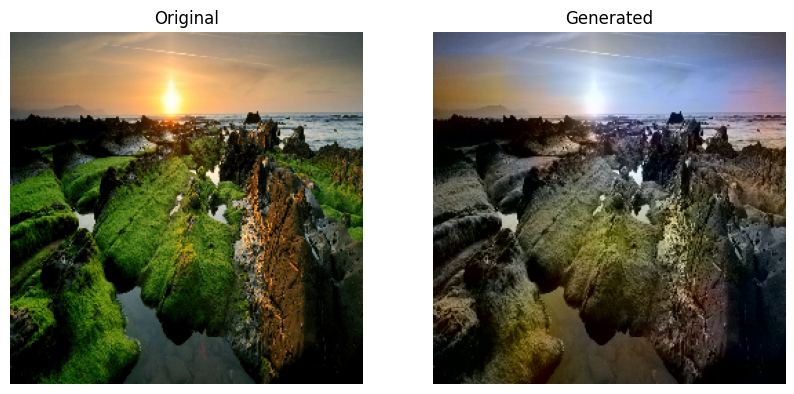

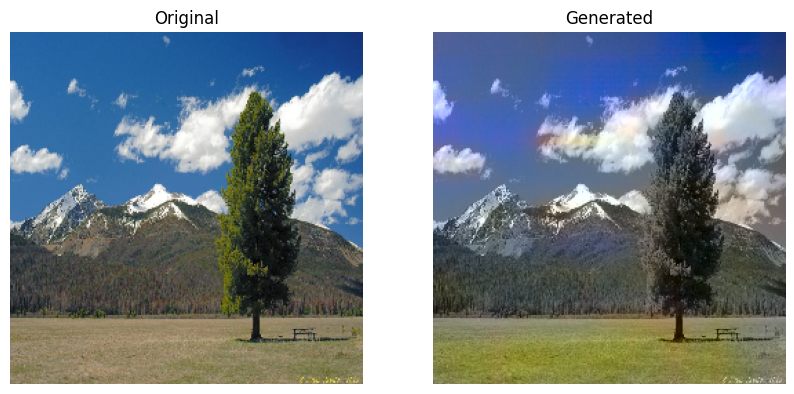

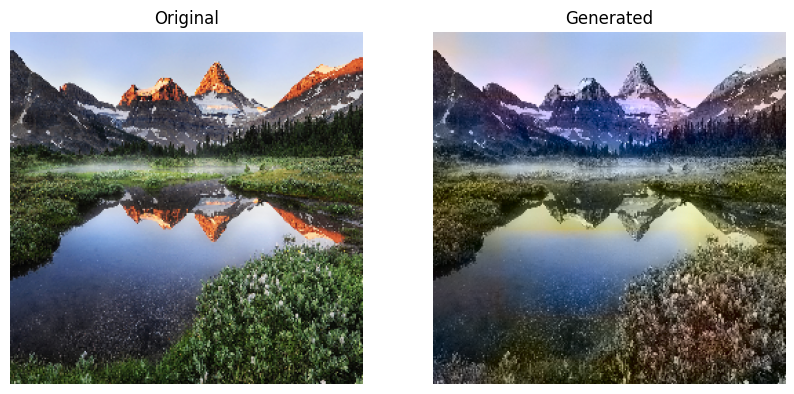

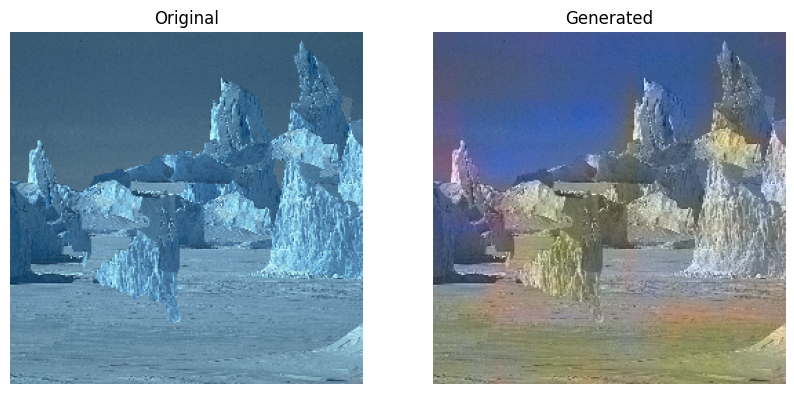

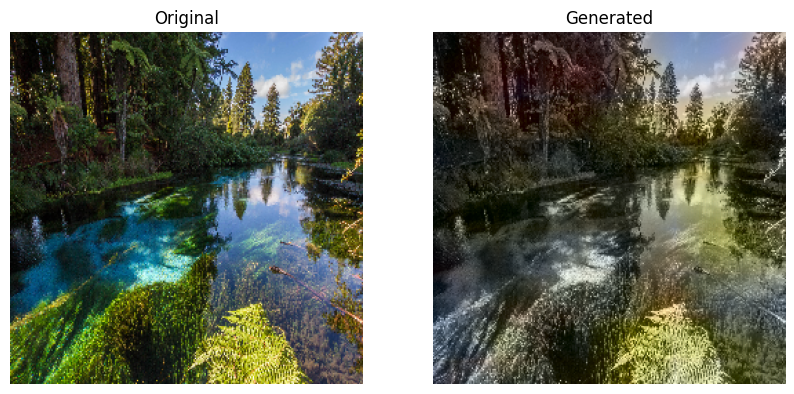

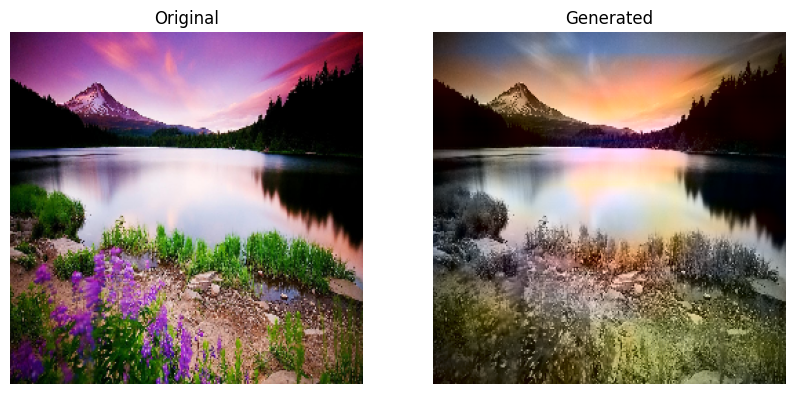

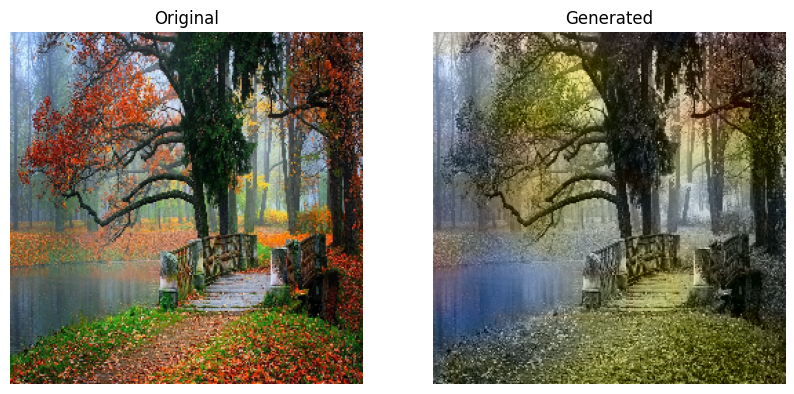

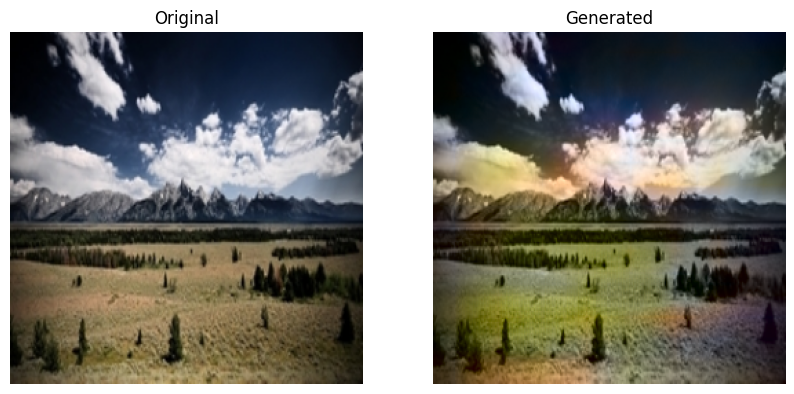

In [147]:
for i in range(len(os.listdir(test_path))):
  img_color=[]
  #r = random.randint(0,l-1)
  img=cv2.imread(test_path + '/' + os.listdir(test_path)[i])
  #img=cv2.imread('/content/Untitled.jpg')  #you can load any picture from the internet
  img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
  img=cv2.resize(img,(SIZE, SIZE))

  fig = plt.figure(figsize=(10, 7))
  fig.add_subplot(1, 2, 1)
  plt.imshow(img)
  plt.axis('off')
  plt.title("Original")

  img_color.append(img)
  img_color = np.array(img_color, dtype=float)
  img_color = rgb2lab(1.0/255*img_color)[:,:,:,0]
  img_color = img_color.reshape(img_color.shape+(1,))
  output = decoder(encoder(torch.Tensor(np.swapaxes(img_color, 1,3)))).cpu().detach().numpy()
  output = np.swapaxes(output, 1, 3)
  output = output*128
  result = np.zeros((SIZE, SIZE, 3))
  result[:,:,0] = img_color[0][:,:,0]
  result[:,:,1:] = output[0]
  result = np.swapaxes(result, 0, 1)
  result = lab2rgb(np.swapaxes(result, 0,1))

  fig.add_subplot(1, 2, 2)
  plt.imshow(result)
  plt.axis('off')
  plt.title("Generated")

  #imsave("{}.png".format(i), result)

Как мы видим, модель может хорошо понимать, где небо, где трава, где река и где дерево. Конечно, время дня для модели понять почти что невозможно, поэтому гамма может отличаться от оригинальных фотографий.
Модель можно будет сохранить и дообучать на большем размере данных.

Здесь вы можете попробовать скачать фотографию (желательно природы) и посмотреть как модель предскажет её цвета

mountain
[%] Downloading Images to /content/testing/mountain


[!!]Indexing page: 1

[%] Indexed 1 Images on Page 1.


[%] Downloading Image #1 from https://data.1freewallpapers.com/download/mountain-lake-sunset-sky-clouds-peak-landscape.jpg
[%] File Downloaded !



[%] Done. Downloaded 1 images.


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 4 pixels
  return func(*args, **kwargs)


Text(0.5, 1.0, 'Generated')

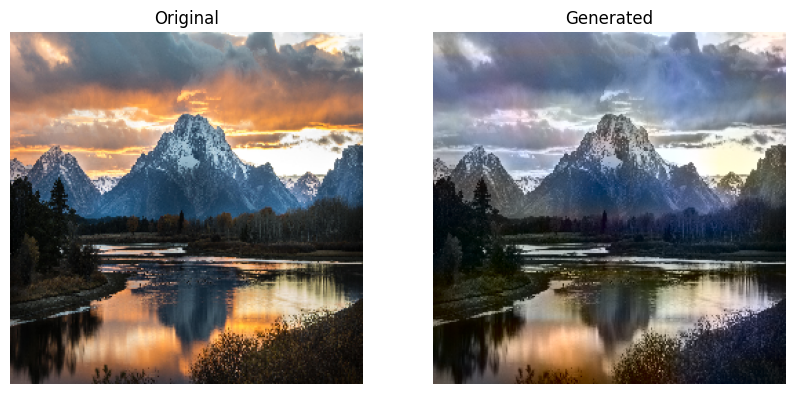

In [153]:
image = str(input())
downloader.download(image, limit=1,  output_dir='testing', 
adult_filter_off=True, force_replace=False, timeout=60)

testing_path = '/content/testing/{}/Image_1.jpg'.format(image)
img_color=[]
img=cv2.imread(testing_path) 
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
img=cv2.resize(img,(SIZE, SIZE))

fig = plt.figure(figsize=(10, 7))
fig.add_subplot(1, 2, 1)
plt.imshow(img)
plt.axis('off')
plt.title("Original")

img_color.append(img)
img_color = np.array(img_color, dtype=float)
img_color = rgb2lab(1.0/255*img_color)[:,:,:,0]
img_color = img_color.reshape(img_color.shape+(1,))
output = decoder(encoder(torch.Tensor(np.swapaxes(img_color, 1,3)))).cpu().detach().numpy()
output = np.swapaxes(output, 1, 3)
output = output*128
result = np.zeros((SIZE, SIZE, 3))
result[:,:,0] = img_color[0][:,:,0]
result[:,:,1:] = output[0]
result = np.swapaxes(result, 0, 1)
result = lab2rgb(np.swapaxes(result, 0,1))

fig.add_subplot(1, 2, 2)
plt.imshow(result)
plt.axis('off')
plt.title("Generated")